# Anime Character Generation

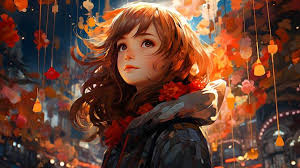

#### Dataset and Resources

**Dataset**: The GAN is trained on an anime character dataset, a collection of anime character images used to teach the GAN to create similar images.

Created By *sawan kumar*  | april 2024

Tasks in this notebook

• Architecture of the GAN

• Loading and Preprocessing the Anime Character Dataset

• Defining the Generator and Discriminator Models

• Training the GAN

• Visualizing the Generated Anime Characters


In [1]:
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/

In [2]:
!chmod 600 /root/.kaggle/kaggle.json


In [3]:
!kaggle datasets download -d splcher/animefacedataset

 96% 377M/395M [00:03<00:00, 153MB/s]
100% 395M/395M [00:03<00:00, 124MB/s]


In [4]:
import zipfile
zip_ref = zipfile.ZipFile('/content/animefacedataset.zip', 'r')
zip_ref.extractall('/content')
zip_ref.close()

### Setup

***This project requires Python 3.7 or above:***



In [5]:
import pandas as pd
import numpy as np
from packaging import version
import sklearn
import sys
assert sys.version_info >= (3, 7)
assert version.parse(sklearn.__version__) >= version.parse("1.0.1")
import tensorflow as tf
assert version.parse(tf.__version__) >= version.parse("2.8.0")
import tensorflow as tf

let's define the default font sizes to make the figures prettier

In [6]:
import matplotlib.pyplot as plt

plt.rc('font', size=14)
plt.rc('axes', labelsize=14, titlesize=14)
plt.rc('legend', fontsize=14)
plt.rc('xtick', labelsize=10)
plt.rc('ytick', labelsize=10)

### GAN Configuration

*image_size*: The size of the images that will be used in the GAN. In this case, it's set to 64x64 pixels.

*latent_size*: The size of the latent space or random noise vector that serves as input to the generator. A larger latent size can allow for more diverse image generation.

*batch_size*: The number of images in each mini-batch used during training.

*epochs*: The number of training epochs, which determines how many times the GAN will go through the entire dataset.



In [66]:
image_size = 64
latent_size = 128
batch_size = 128
epochs = 25
lr = 0.0002


# Dataset Loading and Preprocessing

The code loads and preprocesses the dataset that will be used for training the Generative Adversarial Network (GAN).
`data_dir` should be replaced with the path to the directory containing the dataset (e.g., anime face images).

## Loading the Dataset:
The `tf.keras.utils.image_dataset_from_directory` function is used to load the dataset from the specified directory.
It `resizes` the images to the image_size (64x64 pixels) and forms mini-batches of size batch_size. The `label_mode` is set to None because this is an unsupervised GAN training.

## Preprocessing the Dataset:
After loading, the dataset goes through a preprocessing step to make the pixel values compatible with the GAN architecture.
It scales the pixel values from the range [0, 255] to the range [-1, 1] by subtracting 127.5 and dividing by 127.5.
This transformation ensures that the pixel values are centered around zero, which is essential for GAN training.
The loaded and preprocessed dataset is then used for training the GAN, with real images used to train the discriminator and fake images generated by the generator.



In [67]:
data_dir = '/content/images'

train_dataset = tf.keras.utils.image_dataset_from_directory(
    data_dir,
    image_size=(image_size, image_size),
    batch_size=batch_size,
    label_mode=None
)
train_dataset = train_dataset.map(lambda x: (x - 127.5) / 127.5)


Found 63565 files belonging to 1 classes.


since during the creation of dataset from `image_dataset_from_directory` there are batches of 128 each are created but many images neaarly 77 which left at the end which arent count to 128. these images need to be filter out as they will create data mismatch error during the training phase

In [68]:
# Filter out batches with size other than 128
train_dataset = train_dataset.filter(lambda x: tf.shape(x)[0] == 128)

train_dataset

<_FilterDataset element_spec=TensorSpec(shape=(None, 64, 64, 3), dtype=tf.float32, name=None)>

#### creating a utiility function to display images


In [69]:
# extra code – this cells generates and saves Figure 17-12

def plot_multiple_images(images, n_cols=None):
    n_cols = n_cols or len(images)
    n_rows = (len(images) - 1) // n_cols + 1
    if images.shape[-1] == 1:
        images = images.squeeze(axis=-1)
    plt.figure(figsize=(n_cols, n_rows))
    for index, image in enumerate(images):
        plt.subplot(n_rows, n_cols, index + 1)
        plt.imshow(image, cmap="binary")
        plt.axis("off")

Let’s now turn our attention to GANs model architecture: they are harder to train, but when you
manage to get them to work, they produce pretty amazing images.

## Generator
Takes a random distribution as input (typically Gaussian) and outputs
some data—typically, an image. You can think of the random inputs as
the latent representations (i.e., codings) of the image to be generated. So,
as you can see, the generator offers the same functionality as a decoder in
a variational autoencoder, and it can be used in the same way to generate
new images: just feed it some Gaussian noise, and it outputs a brand-new
image. However, it is trained very differently, as you will soon see.

## Discriminator
Takes either a fake image from the generator or a real image from the
training set as input, and must guess whether the input image is fake or
real.


**During training, the generator and the discriminator have opposite goals: the
discriminator tries to tell fake images from real images, while the generator
tries to produce images that look real enough to trick the discriminator.
Because the GAN is composed of two networks with different objectives, it
cannot be trained like a regular neural network. Each training iteration is
divided into two phases:**


*   In the first phase, we train the discriminator. A batch of real images is
sampled from the training set and is completed with an equal number of
fake images produced by the generator. The labels are set to 0 for fake
images and 1 for real images, and the discriminator is trained on this
labeled batch for one step, using the binary cross-entropy loss.
Importantly, backpropagation only optimizes the weights of the
discriminator during this phase.
*   In the second phase, we train the generator. We first use it to produce
another batch of fake images, and once again the discriminator is used to
tell whether the images are fake or real. This time we do not add real
images in the batch, and all the labels are set to 1 (real): in other words,
we want the generator to produce images that the discriminator will
(wrongly) believe to be real! Crucially, the weights of the discriminator
are frozen during this step, so backpropagation only affects the weights
of the generator.



Let’s go ahead and build a simple GAN on ANIMEFACE Dataset

*First, we need to build the generator and the discriminator.*

The generator is similar to an autoencoder’s decoder, and the discriminator is a regular binary classifier: it takes an image as input and ends with a Dense layer containing a single unit and using the sigmoid activation function. For the second phase of each training iteration, we also need the full GAN model containing the generator followed by the discriminator:

In [70]:
tf.random.set_seed(42)  # extra code – ensures reproducibility on CPU

codings_size = 100
generator = tf.keras.Sequential([
    tf.keras.layers.Dense(4 * 4 * 512, input_shape=(codings_size,)),
    tf.keras.layers.Reshape([4, 4, 512]),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.Conv2DTranspose(256, kernel_size=5, strides=2, padding="same", activation="relu"),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.Conv2DTranspose(128, kernel_size=5, strides=2, padding="same", activation="relu"),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.Conv2DTranspose(64, kernel_size=5, strides=2, padding="same", activation="relu"),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.Conv2DTranspose(3, kernel_size=5, strides=2, padding="same", activation="tanh"),
])


In [71]:
generator.summary()

Model: "sequential_20"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_12 (Dense)            (None, 8192)              827392    
                                                                 
 reshape_2 (Reshape)         (None, 4, 4, 512)         0         
                                                                 
 batch_normalization_6 (Bat  (None, 4, 4, 512)         2048      
 chNormalization)                                                
                                                                 
 conv2d_transpose_6 (Conv2D  (None, 8, 8, 256)         3277056   
 Transpose)                                                      
                                                                 
 batch_normalization_7 (Bat  (None, 8, 8, 256)         1024      
 chNormalization)                                                
                                                     

In [72]:
discriminator = tf.keras.Sequential([
    tf.keras.layers.Input(shape=(image_size, image_size, 3)),
    tf.keras.layers.Conv2D(64, kernel_size=5, strides=2, padding="same",
                           activation=tf.keras.layers.LeakyReLU(0.2)),
    tf.keras.layers.Dropout(0.4),
    tf.keras.layers.Conv2D(128, kernel_size=5, strides=2, padding="same",
                           activation=tf.keras.layers.LeakyReLU(0.2)),
    tf.keras.layers.Dropout(0.4),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(1, activation="sigmoid")
])

In [73]:
discriminator.summary()

Model: "sequential_21"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_20 (Conv2D)          (None, 32, 32, 64)        4864      
                                                                 
 dropout_20 (Dropout)        (None, 32, 32, 64)        0         
                                                                 
 conv2d_21 (Conv2D)          (None, 16, 16, 128)       204928    
                                                                 
 dropout_21 (Dropout)        (None, 16, 16, 128)       0         
                                                                 
 flatten_10 (Flatten)        (None, 32768)             0         
                                                                 
 dense_13 (Dense)            (None, 1)                 32769     
                                                                 
Total params: 242561 (947.50 KB)
Trainable params: 24

In [74]:
gan = tf.keras.Sequential([generator, discriminator])

In [75]:
gan.summary()

Model: "sequential_22"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 sequential_20 (Sequential)  (None, 64, 64, 3)         5137283   
                                                                 
 sequential_21 (Sequential)  (None, 1)                 242561    
                                                                 
Total params: 5379844 (20.52 MB)
Trainable params: 5377924 (20.52 MB)
Non-trainable params: 1920 (7.50 KB)
_________________________________________________________________


*Next, we need to compile these models.*

As the discriminator is a binary
classifier, we can naturally use the binary cross-entropy loss. The gan model
is also a binary classifier, so it can use the binary cross-entropy loss as well.
However, the generator will only be trained through the gan model, so we do
not need to compile it at all. Importantly, the discriminator should not be
trained during the second phase, so we make it non-trainable before
compiling the gan model:

In [76]:
discriminator.compile(loss="binary_crossentropy", optimizer="rmsprop" , metrics=['accuracy'])
discriminator.trainable = False
gan.compile(loss="binary_crossentropy", optimizer="rmsprop")


*Since the training loop is unusual, we cannot use the regular fit() method.
Instead, we will write a custom training loop. For this, we first need to create
a Dataset to iterate through the images:*

In [77]:
dataset =train_dataset.shuffle(1000)
dataset = dataset.prefetch(1)
dataset

*We are now ready to write the training loop. Let’s wrap it in a train_gan()
function:*

Epoch 1/50


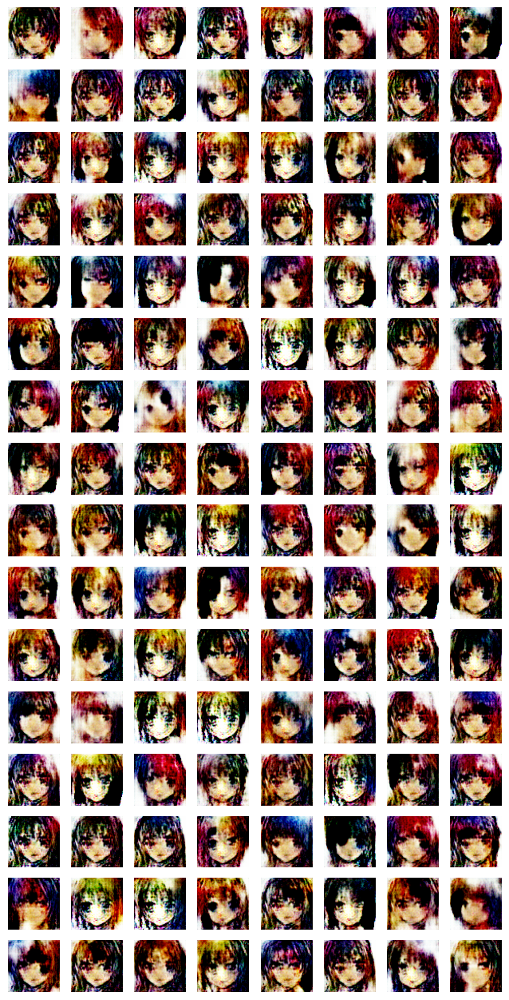

Epoch 2/50


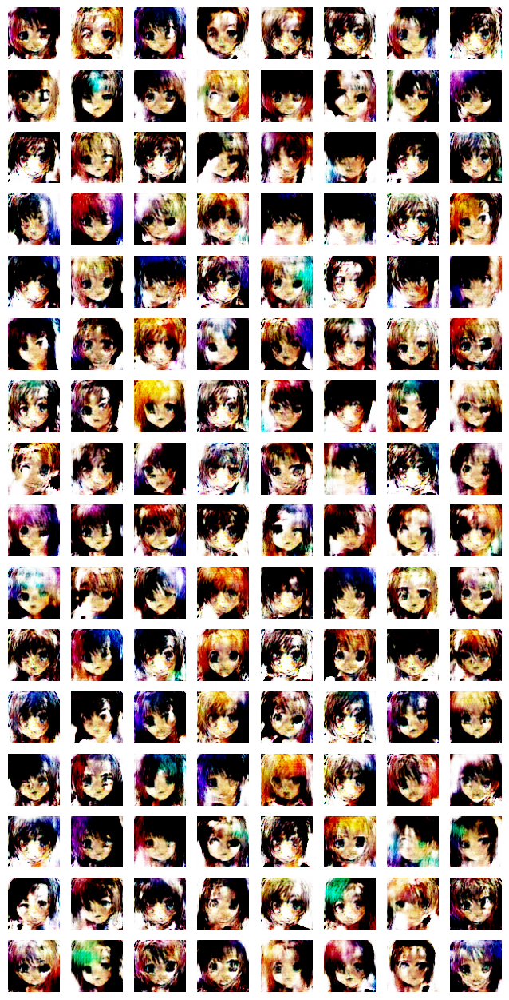

Epoch 3/50


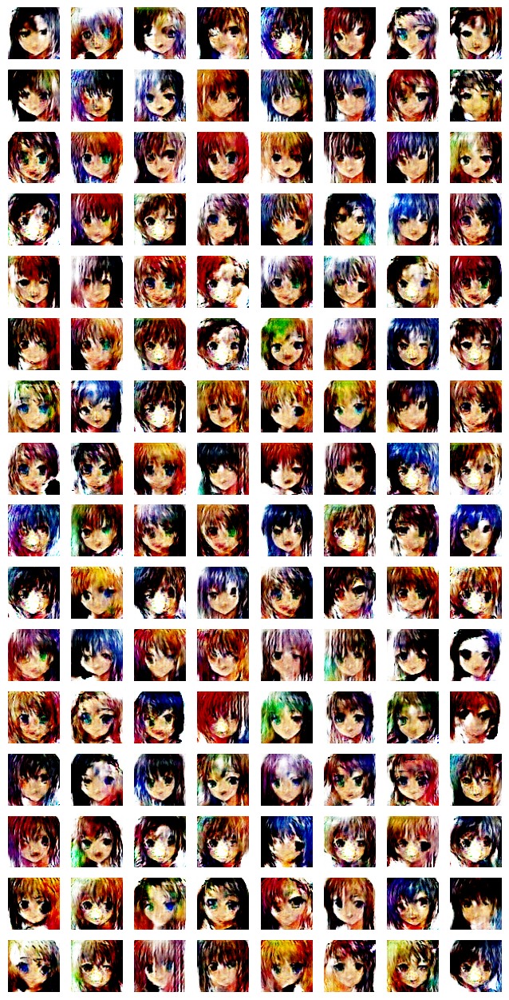

Epoch 4/50


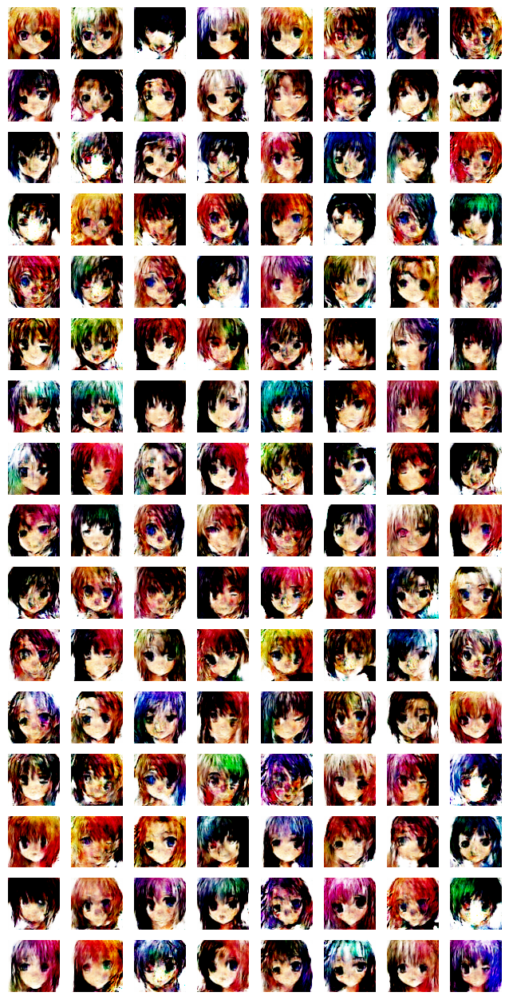

Epoch 5/50


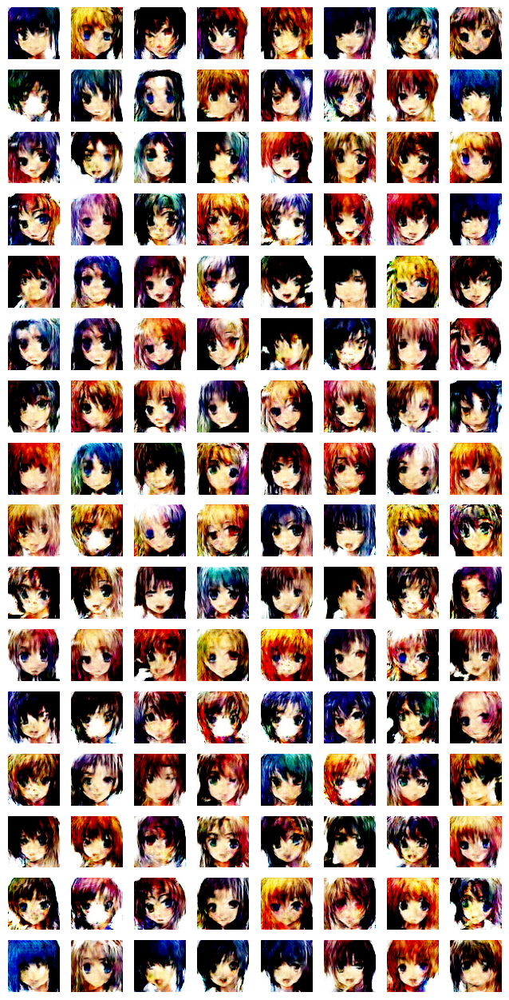

Epoch 6/50


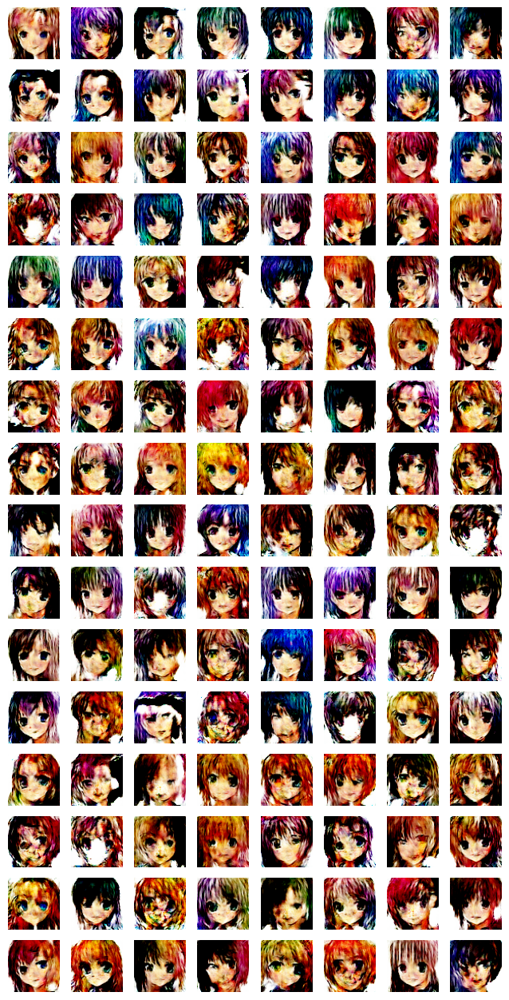

Epoch 7/50


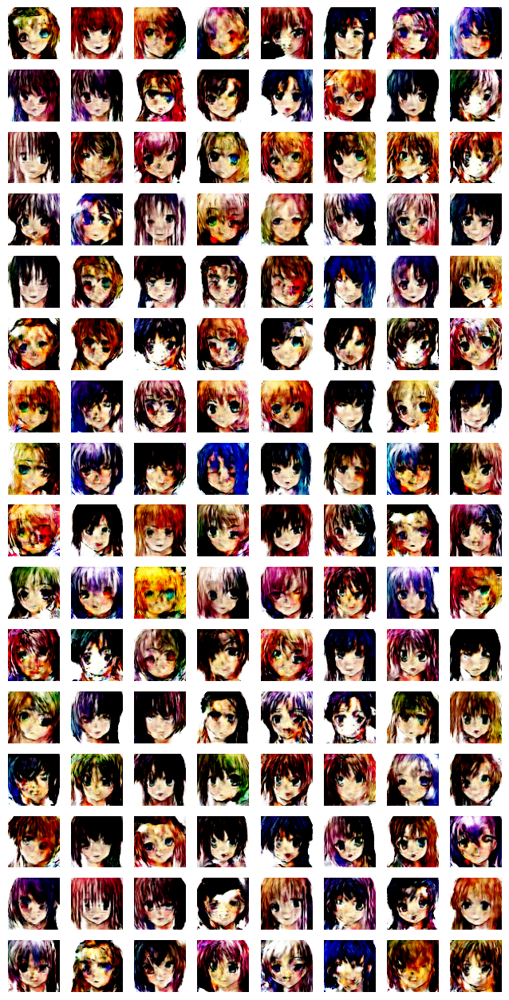

Epoch 8/50


KeyboardInterrupt: 

In [79]:
def train_gan(gan, dataset, batch_size, codings_size, n_epochs):
    generator, discriminator = gan.layers
    for epoch in range(n_epochs):
        print(f"Epoch {epoch + 1}/{n_epochs}")  # extra code
        for X_batch in dataset:
            # phase 1 - training the discriminator
            noise = tf.random.normal(shape=[batch_size, codings_size])
            generated_images = generator(noise)
            X_fake_and_real = tf.concat([generated_images, X_batch], axis=0)
            y1 = tf.constant([[0.]] * batch_size + [[1.]] * batch_size)
            discriminator.train_on_batch(X_fake_and_real, y1)
            # phase 2 - training the generator
            noise = tf.random.normal(shape=[batch_size, codings_size])
            y2 = tf.constant([[1.]] * batch_size)
            gan.train_on_batch(noise, y2)
        # extra code — plot images during training
        plot_multiple_images(generated_images.numpy(), 8)
        plt.show()

train_gan(gan, dataset, batch_size, codings_size, n_epochs=50)

*That’s it! After training, we can randomly sample some codings from a
Gaussian distribution, and feed them to the generator to produce new images:*

In [80]:
codings = tf.random.normal(shape=[batch_size, codings_size])
generated_images = generator.predict(codings)


4/4 [==============================] - 0s 47ms/step


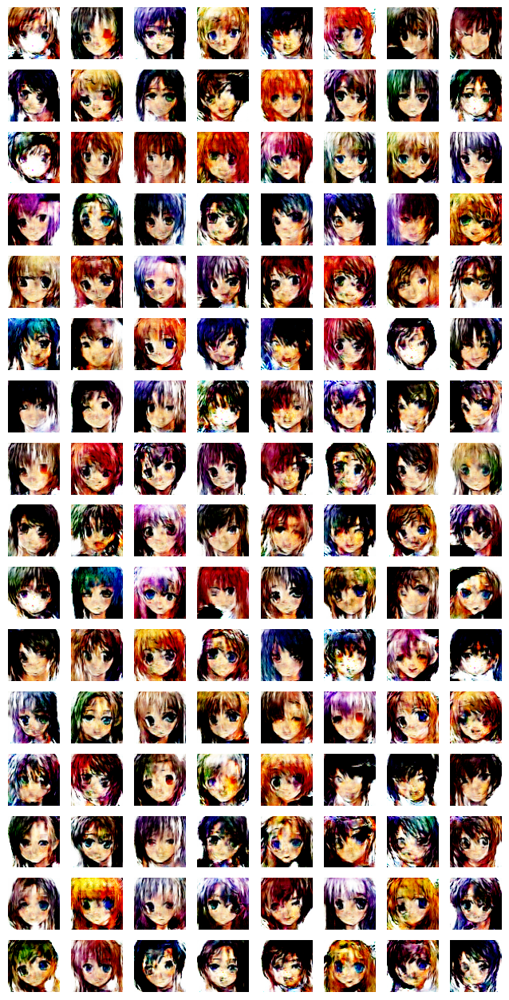

In [81]:
plot_multiple_images(generated_images, 8)
# # save_fig("gan_generated_images_plot", tight_layout=False)
plt.show()

i haven't trained the model for all 50 epocs as it is much time consuming , but still we can see our model has produced convincing images with just 7 epochs

## thankyou